In [16]:
!ls
!rm -rf jpeg
%cd /kaggle/working/


datasets  dog.jpeg  runs  yolo12n.pt
/kaggle/working


In [17]:
import os
HOME = os.getcwd()
print(HOME)

/kaggle/working


In [4]:
!pip install -U ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.202 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6411.4/8062.4 GB disk)


In [5]:
from ultralytics import YOLO

from IPython.display import display, Image

In [6]:
# Run inference on an image with YOLO12n
# !yolo predict model=yolo12n.pt source='https://ultralytics.com/images/zidane.jpg'

%cd {HOME}
!yolo predict mode=predict model=yolo12n.pt conf=0.25 source='https://media.roboflow.com/notebooks/examples/dog.jpeg' save=True

/kaggle/working
Ultralytics 8.3.202 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12n summary (fused): 159 layers, 2,590,824 parameters, 0 gradients, 6.5 GFLOPs

image 1/1 /kaggle/working/dog.jpeg: 640x384 1 person, 1 car, 2 dogs, 70.6ms
Speed: 19.5ms preprocess, 70.6ms inference, 473.9ms postprocess per image at shape (1, 3, 640, 384)
Results saved to /kaggle/working/runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


/kaggle/working


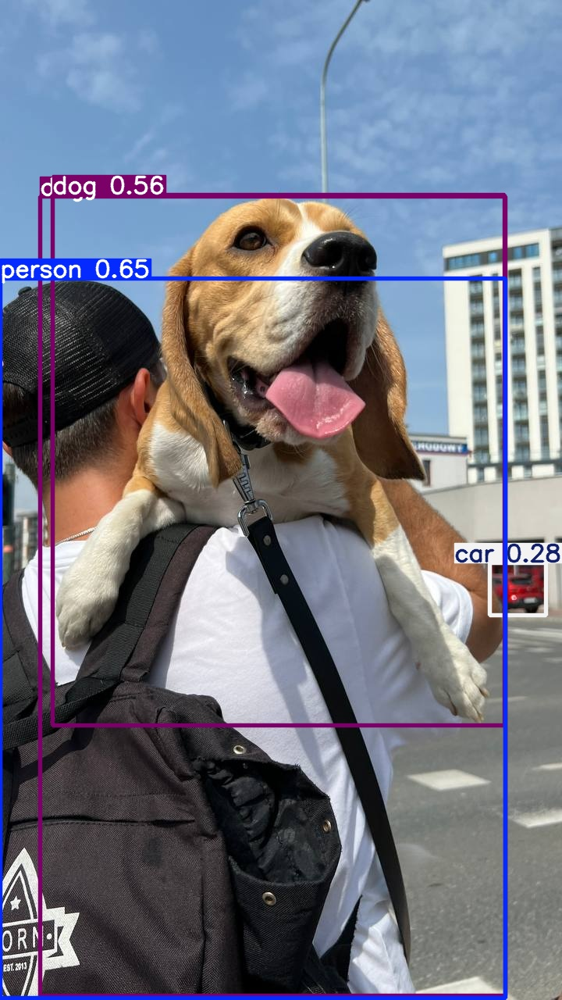

In [7]:
%cd {HOME}
# Image('runs/detect/predict/dog.jpeg')
Image(filename='runs/detect/predict/dog.jpg', height=600)

In [8]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet

from roboflow import Roboflow
rf = Roboflow(api_key="n12mRmQdWmrjCSKFgJMC")
project = rf.workspace("waste-detections-by-fu").project("waste-detections-c0mkz")
version = project.version(6)
dataset = version.download("yolov12")

/kaggle/working/datasets
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.7/88.7 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 35.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 56.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 83.3 MB/s eta 0:00:00:00:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.8.0 requires google-cloud-bigquery-storage<3.0.0,>=2.30.0, which is not installed.
datasets 3.6.0 requires fsspec[http]<=2025.3.0,>=2023.1.0, but you have fsspec 2025.5.1 which is incompatible.
google-colab 1.0.0 requires google-auth==2.38.0, but you have google-auth 2.40.3 which is incompatible.
google-colab 1.0.0 requires notebook==6.5.7, but you have notebook 6.5.4 which is in


Extracting Dataset Version Zip to Waste-Detections-6 in yolov12:: 100%|██████████| 14224/14224 [00:02<00:00, 5653.18it/s]


In [9]:
dataset.location

'/kaggle/working/datasets/Waste-Detections-6'

In [10]:
!pip install Pillow


In [ ]:
# import os
# from PIL import Image
# from pathlib import Path

# def compress_images_recursively(input_dir, output_dir):
#     """
#     Compresses all images in a directory and its subdirectories to lossless WebP format.

#     Args:
#         input_dir (str): The path to the directory containing the original images.
#         output_dir (str): The path to the directory where compressed images will be saved.
#     """
#     input_path = Path(input_dir)
#     output_path = Path(output_dir)

#     # Check if the input directory exists
#     if not input_path.is_dir():
#         print(f"Error: Input directory '{input_dir}' not found.")
#         return

#     # Create the output directory if it doesn't exist
#     output_path.mkdir(parents=True, exist_ok=True)

#     # Walk through the input directory and its subdirectories
#     for root, _, files in os.walk(input_path):
#         for filename in files:
#             # Check for common image file extensions
#             if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
#                 try:
#                     # Construct full input and output file paths
#                     input_filepath = Path(root) / filename
                    
#                     # Create corresponding subdirectories in the output folder
#                     relative_path = input_filepath.relative_to(input_path).parent
#                     current_output_dir = output_path / relative_path
#                     current_output_dir.mkdir(parents=True, exist_ok=True)
                    
#                     # Define output filename with .webp extension
#                     output_filepath = current_output_dir / (input_filepath.stem + ".webp")

#                     # Open and save the image with lossless compression
#                     with Image.open(input_filepath) as img:
#                         img.save(output_filepath, format="WebP", lossless=True)
#                         print(f"Compressed '{input_filepath}' to '{output_filepath}'")

#                 except Exception as e:
#                     print(f"Error processing image '{input_filepath}': {e}")

# # Example usage with your specified paths
# input_folder = '/kaggle/working/datasets/Waste-Detections-6/train'
# output_folder = '/kaggle/working/datasets/Waste-Detections-6/train-compressed'
# compress_images_recursively(input_folder, output_folder)



Compressed '/kaggle/working/datasets/Waste-Detections-6/train/images/IMG_4945_JPG.rf.e57fac53e8deb59ebd9f3404bf395f48.jpg' to '/kaggle/working/datasets/Waste-Detections-6/train-compressed/images/IMG_4945_JPG.rf.e57fac53e8deb59ebd9f3404bf395f48.webp'
Compressed '/kaggle/working/datasets/Waste-Detections-6/train/images/IMG_20250303_135823_jpg.rf.7b761ecb95a0937243e15fad60127721.jpg' to '/kaggle/working/datasets/Waste-Detections-6/train-compressed/images/IMG_20250303_135823_jpg.rf.7b761ecb95a0937243e15fad60127721.webp'
Compressed '/kaggle/working/datasets/Waste-Detections-6/train/images/IMG-20250403-WA0090_jpg.rf.511a6a983ee5027b7633de1c58dcd0b6.jpg' to '/kaggle/working/datasets/Waste-Detections-6/train-compressed/images/IMG-20250403-WA0090_jpg.rf.511a6a983ee5027b7633de1c58dcd0b6.webp'
Compressed '/kaggle/working/datasets/Waste-Detections-6/train/images/IMG-20250403-WA0245_jpg.rf.42787be53c1a594312b7fe12869811ff.jpg' to '/kaggle/working/datasets/Waste-Detections-6/train-compressed/images/

In [11]:
# import os
# from PIL import Image
# from pathlib import Path

# def compress_images_same_format(input_dir, output_dir):
#     """
#     Compresses all images in a directory and its subdirectories, preserving the original format.

#     Args:
#         input_dir (str): The path to the directory containing the original images.
#         output_dir (str): The path to the directory where compressed images will be saved.
#     """
#     input_path = Path(input_dir)
#     output_path = Path(output_dir)

#     if not input_path.is_dir():
#         print(f"Error: Input directory '{input_dir}' not found.")
#         return

#     output_path.mkdir(parents=True, exist_ok=True)

#     for root, _, files in os.walk(input_path):
#         for filename in files:
#             # Check for common image file extensions
#             if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
#                 try:
#                     input_filepath = Path(root) / filename
                    
#                     # Create corresponding subdirectories in the output folder
#                     relative_path = input_filepath.relative_to(input_path).parent
#                     current_output_dir = output_path / relative_path
#                     current_output_dir.mkdir(parents=True, exist_ok=True)
                    
#                     # Keep the original filename and extension
#                     output_filepath = current_output_dir / filename

#                     with Image.open(input_filepath) as img:
#                         # Get the original format
#                         original_format = img.format
                        
#                         # Use optimize=True for all supported formats.
#                         # For JPEG, use a high quality setting (e.g., 95)
#                         # to minimize visible changes.
#                         if original_format == 'JPEG':
#                             img.save(output_filepath, format=original_format, optimize=True, quality=95)
#                         else:
#                             # Use optimize=True for lossless formats like PNG
#                             img.save(output_filepath, format=original_format, optimize=True)
                        
#                         # print(f"Compressed '{input_filepath}' to '{output_filepath}' (format: {original_format})")
#                         print(f"Compressed '{input_filepath}' to '{output_filepath}' (format: {original_format})")

#                 except Exception as e:
#                     print(f"Error processing image '{input_filepath}': {e}")

# # Example usage with your specified paths
# input_folder = '/kaggle/working'
# output_folder = '/kaggle/working/jpeg'

# # input_folder = '/kaggle/working/datasets/Waste-Detections-6/train'
# # output_folder = '/kaggle/working/datasets/Waste-Detections-6/train-compressed-jpeg'
# compress_images_same_format(input_folder, output_folder)


Compressed '/kaggle/working/dog.jpeg' to '/kaggle/working/jpeg/dog.jpeg' (format: JPEG)
Compressed '/kaggle/working/datasets/Waste-Detections-6/test/images/IMG-20250328-WA0372_jpg.rf.aded6e72a261105aa273533d74e79f13.jpg' to '/kaggle/working/jpeg/datasets/Waste-Detections-6/test/images/IMG-20250328-WA0372_jpg.rf.aded6e72a261105aa273533d74e79f13.jpg' (format: JPEG)
Compressed '/kaggle/working/datasets/Waste-Detections-6/test/images/IMG-20250403-WA0163_jpg.rf.064b79e74f95e6807b93e4d797f5d9c3.jpg' to '/kaggle/working/jpeg/datasets/Waste-Detections-6/test/images/IMG-20250403-WA0163_jpg.rf.064b79e74f95e6807b93e4d797f5d9c3.jpg' (format: JPEG)
Compressed '/kaggle/working/datasets/Waste-Detections-6/test/images/IMG_20250314_154505_jpg.rf.f750428871539edd12d774214f8c560e.jpg' to '/kaggle/working/jpeg/datasets/Waste-Detections-6/test/images/IMG_20250314_154505_jpg.rf.f750428871539edd12d774214f8c560e.jpg' (format: JPEG)
Compressed '/kaggle/working/datasets/Waste-Detections-6/test/images/IMG-202504

KeyboardInterrupt: 

In [20]:
import os

def get_directory_size(path):
    """
    Calculates the total size of a directory in bytes.
    """
    total_size = 0
    for dirpath, dirnames, filenames in os.walk(path):
        for f in filenames:
            fp = os.path.join(dirpath, f)
            # Skip if it's a symbolic link or if it's inaccessible (e.g., permissions)
            if not os.path.islink(fp) and os.path.exists(fp):
                total_size += os.path.getsize(fp)
    return total_size

# Example usage in a Kaggle notebook:
# Assuming your input data is in '/kaggle/input'
input_dir_path = ['/kaggle/working/datasets/Waste-Detections-6/train','/kaggle/working/datasets/Waste-Detections-6/test','/kaggle/working/datasets/Waste-Detections-6/valid',]

for p in input_dir_path:
    size_bytes = get_directory_size(p)
    size_mb = size_bytes / (1024 * 1024) # Convert to MB
    print(f"Size of '{p}': {size_mb:.2f} MB")


Size of '/kaggle/working/datasets/Waste-Detections-6/train': 567.43 MB
Size of '/kaggle/working/datasets/Waste-Detections-6/test': 23.95 MB
Size of '/kaggle/working/datasets/Waste-Detections-6/valid': 37.58 MB


In [21]:
# Train YOLO12n
%cd {HOME}

!yolo train model=yolo12n.pt data={dataset.location}/data.yaml epochs=50 imgsz=640 plots=True device=0,1

/kaggle/working
Ultralytics 8.3.202 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
                                                       CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/datasets/Waste-Detections-6/data.yaml, degrees=0.0, deterministic=True, device=0,1, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo12n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, 

In [22]:
!ls {HOME}/runs/detect/train/

args.yaml			 results.csv	       val_batch0_labels.jpg
BoxF1_curve.png			 results.png	       val_batch0_pred.jpg
BoxP_curve.png			 train_batch0.jpg      val_batch1_labels.jpg
BoxPR_curve.png			 train_batch16000.jpg  val_batch1_pred.jpg
BoxR_curve.png			 train_batch16001.jpg  val_batch2_labels.jpg
confusion_matrix_normalized.png  train_batch16002.jpg  val_batch2_pred.jpg
confusion_matrix.png		 train_batch1.jpg      weights
labels.jpg			 train_batch2.jpg


/kaggle/working


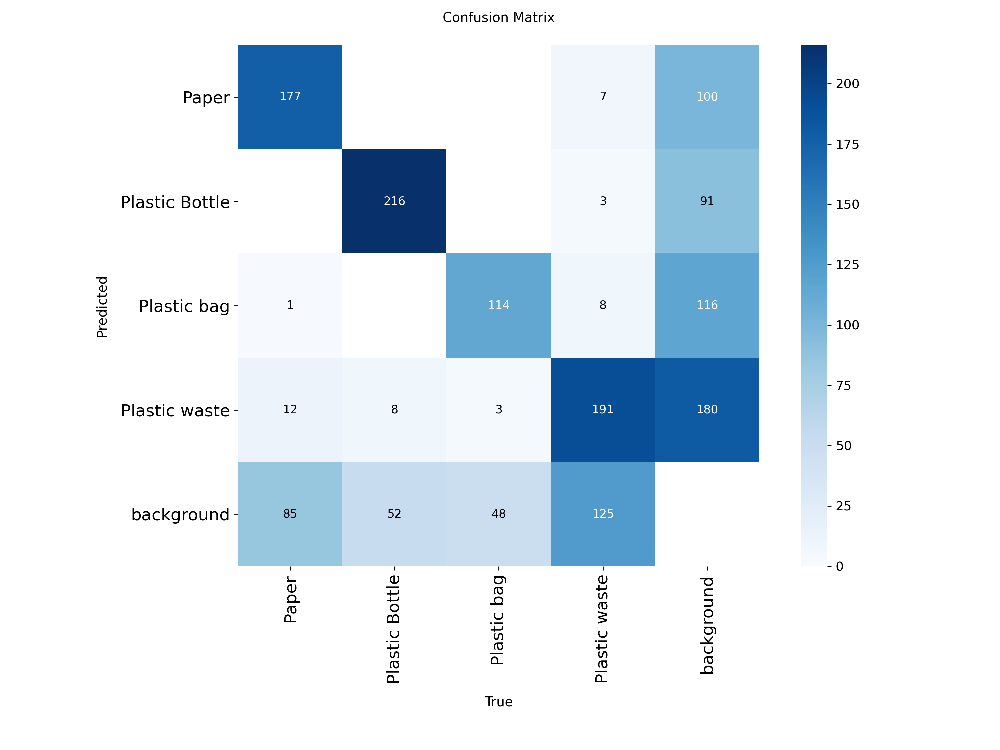

In [25]:
%cd {HOME}
Image.open(f'{HOME}/runs/detect/train/confusion_matrix.png')

/kaggle/working


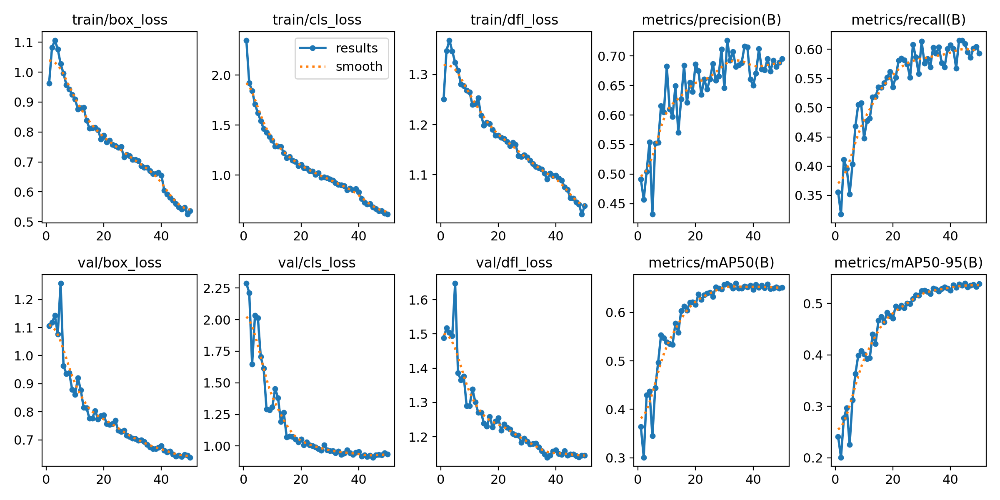

In [26]:
%cd {HOME}
Image.open(f'{HOME}/runs/detect/train/results.png')

/kaggle/working


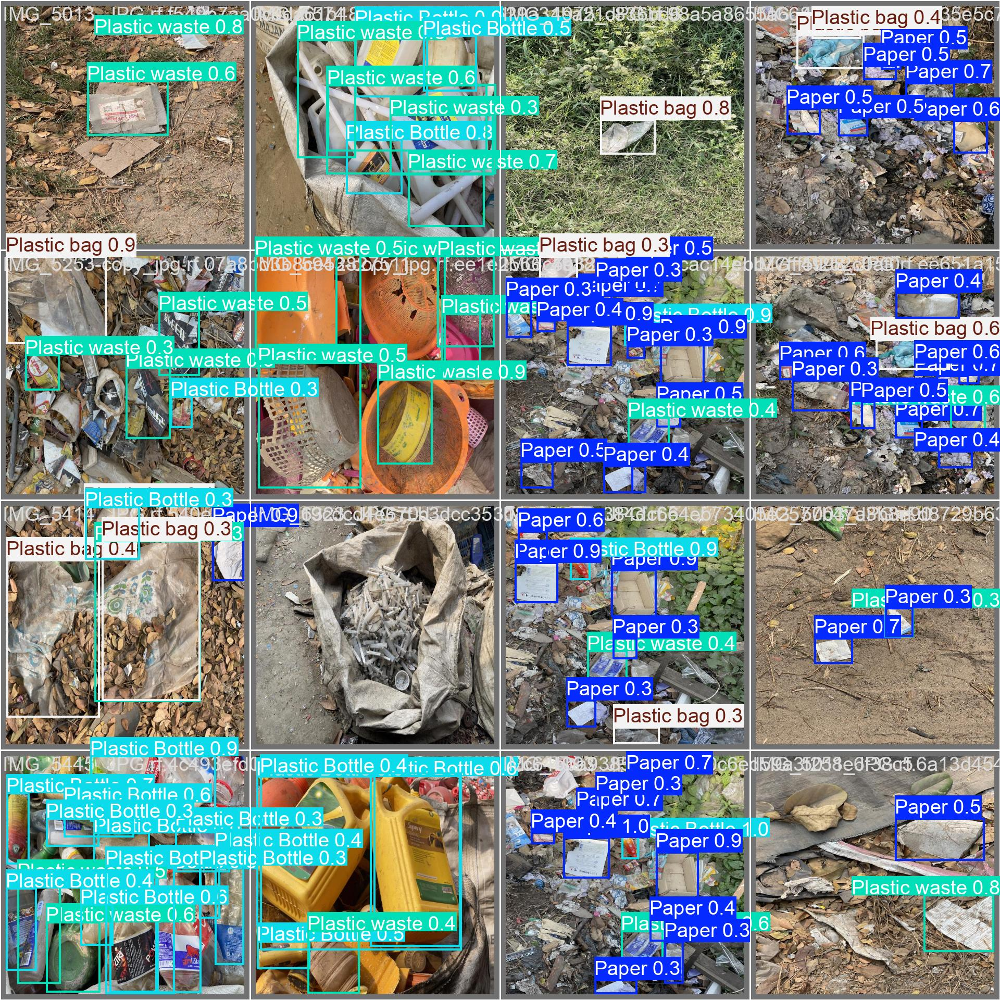

In [27]:
%cd {HOME}
Image.open(f'{HOME}/runs/detect/train/val_batch0_pred.jpg')

In [28]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/kaggle/working
Ultralytics 8.3.202 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12n summary (fused): 159 layers, 2,557,508 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2187.7±907.7 MB/s, size: 80.2 KB)
val: Scanning /kaggle/working/datasets/Waste-Detections-6/valid/labels.cache... 427 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 427/427 8.5Mit/s 0.0ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 27/27 5.2it/s 5.2s0.1s
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
                   all        427       1050      0.695      0.611      0.658      0.539
                 Paper        151        275      0.736      0.585      0.698      0.5

In [29]:
!yolo export model={HOME}/runs/detect/train/weights/best.pt format=torchscript

Ultralytics 8.3.202 🚀 Python-3.11.13 torch-2.6.0+cu124 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLOv12n summary (fused): 159 layers, 2,557,508 parameters, 0 gradients, 6.3 GFLOPs

PyTorch: starting from '/kaggle/working/runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 8, 8400) (5.3 MB)

TorchScript: starting export with torch 2.6.0+cu124...
TorchScript: export success ✅ 3.2s, saved as '/kaggle/working/runs/detect/train/weights/best.torchscript' (10.4 MB)

Export complete (3.9s)
Results saved to /kaggle/working/runs/detect/train/weights
Predict:         yolo predict task=detect model=/kaggle/working/runs/detect/train/weights/best.torchscript imgsz=640  
Validate:        yolo val task=detect model=/kaggle/working/runs/detect/train/weights/best.torchscript imgsz=640 data=/kaggle/working/datasets/Waste-Detectio

In [30]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/kaggle/working
Ultralytics 8.3.202 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12n summary (fused): 159 layers, 2,557,508 parameters, 0 gradients, 6.3 GFLOPs

image 1/283 /kaggle/working/datasets/Waste-Detections-6/test/images/20250303_141402_jpg.rf.eca6609b65e2645932230f9186be83f4.jpg: 640x640 8 Plastic Bottles, 15.9ms
image 2/283 /kaggle/working/datasets/Waste-Detections-6/test/images/20250303_141446_jpg.rf.fff8ddd58bfa68db3ad17b97c8d21949.jpg: 640x640 1 Paper, 6 Plastic wastes, 14.3ms
image 3/283 /kaggle/working/datasets/Waste-Detections-6/test/images/20250303_141649_jpg.rf.30d1a279399f53b8d35f8567c01d9874.jpg: 640x640 4 Plastic wastes, 13.4ms
image 4/283 /kaggle/working/datasets/Waste-Detections-6/test/images/20250303_141652_jpg.rf.f9c3ff2eb28a69c88222dc0a89e4a0ac.jpg: 640x640 4 Plastic wastes, 13.3ms
image 5/283 /kaggle/working/datasets/Waste-Detections-6/test/images/20250303_141654_jpg.rf.0a76417ecdcfc7ae4fffb7fa0cdb3d21.jpg: 640x640 7 Plastic wastes, 13.

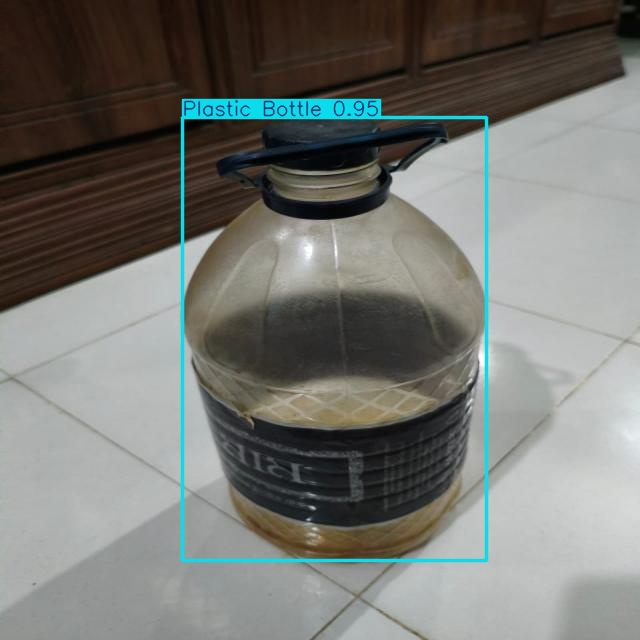

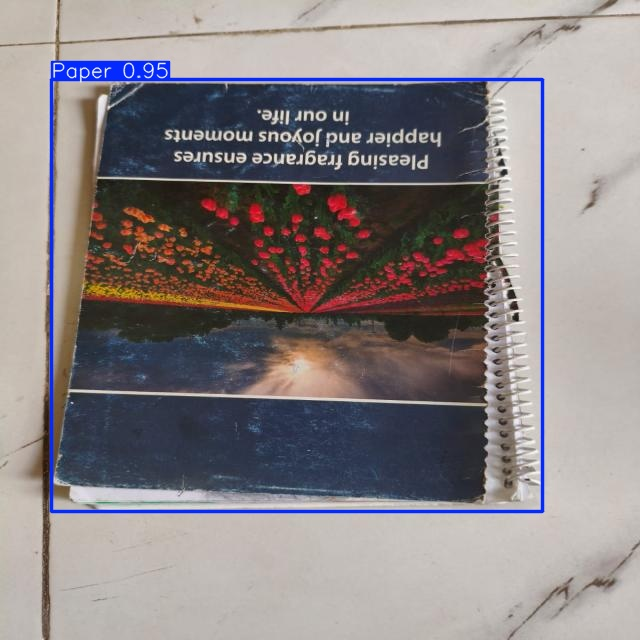

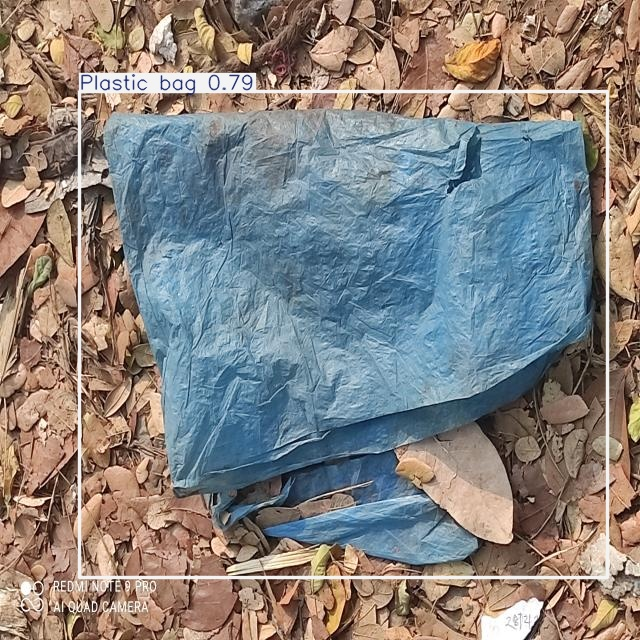

In [31]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict2/*.jpg')[:3]:
      display(Image(filename=image_path, width=600))
      print("\n")

In [32]:
! zip -r yolov12n_recyclablewaste.zip {HOME}/runs/

  adding: kaggle/working/runs/ (stored 0%)
  adding: kaggle/working/runs/detect/ (stored 0%)
  adding: kaggle/working/runs/detect/predict/ (stored 0%)
  adding: kaggle/working/runs/detect/predict/dog.jpg (deflated 6%)
  adding: kaggle/working/runs/detect/predict2/ (stored 0%)
  adding: kaggle/working/runs/detect/predict2/IMG-20250328-WA0372_jpg.rf.aded6e72a261105aa273533d74e79f13.jpg (deflated 6%)
  adding: kaggle/working/runs/detect/predict2/IMG-20250403-WA0163_jpg.rf.064b79e74f95e6807b93e4d797f5d9c3.jpg (deflated 6%)
  adding: kaggle/working/runs/detect/predict2/IMG_20250314_154505_jpg.rf.f750428871539edd12d774214f8c560e.jpg (deflated 5%)
  adding: kaggle/working/runs/detect/predict2/IMG-20250403-WA0232_jpg.rf.47aaed4991a2213ca04f1007c87939c1.jpg (deflated 7%)
  adding: kaggle/working/runs/detect/predict2/IMG-001-81-_jpg.rf.73c598ec1bd53eeefa42d9bf10075ee1.jpg (deflated 5%)
  adding: kaggle/working/runs/detect/predict2/IMG_20250303_141854_jpg.rf.64bfa5d62f016551483907af24aa14d7.jpg (